# TMA Image Analysis
This notebook shows how to use the `TMA Image Analysis` components of `napari-prism` to perform masking, dearraying, segmenting and measuring on the raw .qptiff tissue microarray image into a structured {class}`anndata.AnnData` object containing cell level information.

We continue on with the NSCLSC4301 dataset from the [previous section](./getting_started.ipynb), already loaded and parsed into a SpatialData .zarr file.

In [1]:
# Below code loads napari to notebook for screenshot purposes
# All functions done on the viewer window3
import warnings

import matplotlib.pyplot as plt
import napari
from IPython import get_ipython
from loguru import logger


class ScreenshotContext:
    def __enter__(self):
        get_ipython().run_line_magic("matplotlib", "inline")

    def __exit__(self, exc_type, exc_value, traceback):
        get_ipython().run_line_magic("matplotlib", "qt")


plt.rcParams["figure.figsize"] = (20, 20)
warnings.filterwarnings("ignore")
logger.remove()
viewer = napari.current_viewer() or napari.Viewer()

## Masking

The first operation we perform is image masking. This is done to generate a more discrete representation of where the TMA cores are by doing this on a ubiquitious cell nuclei marker like `DAPI`.

We currently provide a mini-pipeline for generating image masks, comprised of a sequence of the following operations:
1. A gaussian blur with a sigma/spread equal to a user set size (here in um, converted to px)
2. An expansion of the blur by user set size (um)
3. A series of user-tickable optional operations (in below order):
- Li Thresholding
- 2D sobel / edge filter
- Local histogram equalisation
- Gamma correction (0.2 value)

The outputs are:
1) A binary mask (`{channels}_mask`)
2) A thresholded polygon representation of the binary mask (`{channels}_mask_poly`)

### Steps 

1. Select the `DAPI` var in the `View (napari-spatialdata)` widget
1. Select the `TMA Image Analysis (napari-prism)` widget tab on the bottom-right

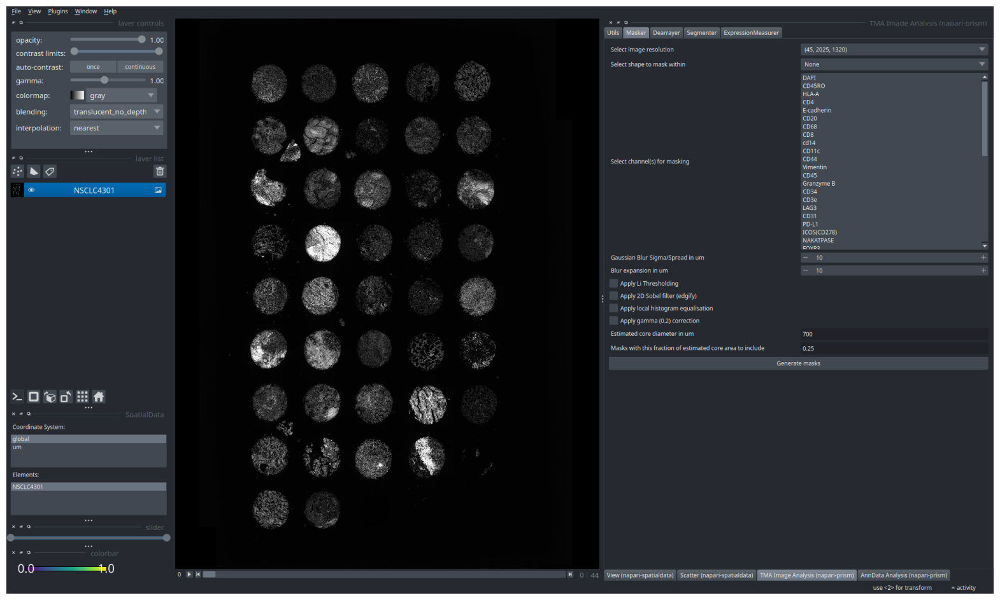

In [2]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

3. Select an image resolution (Channels, Y pixels, X pixels) to perform image masking. Recommended to do this on the lowest resolution (45, 2025, 1320):

<p align="center">
  <img src="../_static/notebook_images/masking_resolution.png" />
</p>


### (Optional) Constrain the masking operation to a bounding box

4. Create a new `Shapes` layer by selecting the polygon icon <img src="../_static/notebook_images/shapes_napari_icon.png" width="25"> in the layer list
5. . (Optional) rename this layer by double-clicking the layer name, typing a new name (i.e. `bounding_box`), then Enter
6. Create a rectangle shape in this layer by selecting the 4-pointed square icon <img src="../_static/notebook_images/rectangle_napari_icon.png" width="25"> in the layer controls. Adjust the opacity to make more transparent.
7. Reselect the `NSCLSC4301` layer
8. In `Select shape to mask within` of the Masker widget tab, select the named shape layer (`bounding_box`)

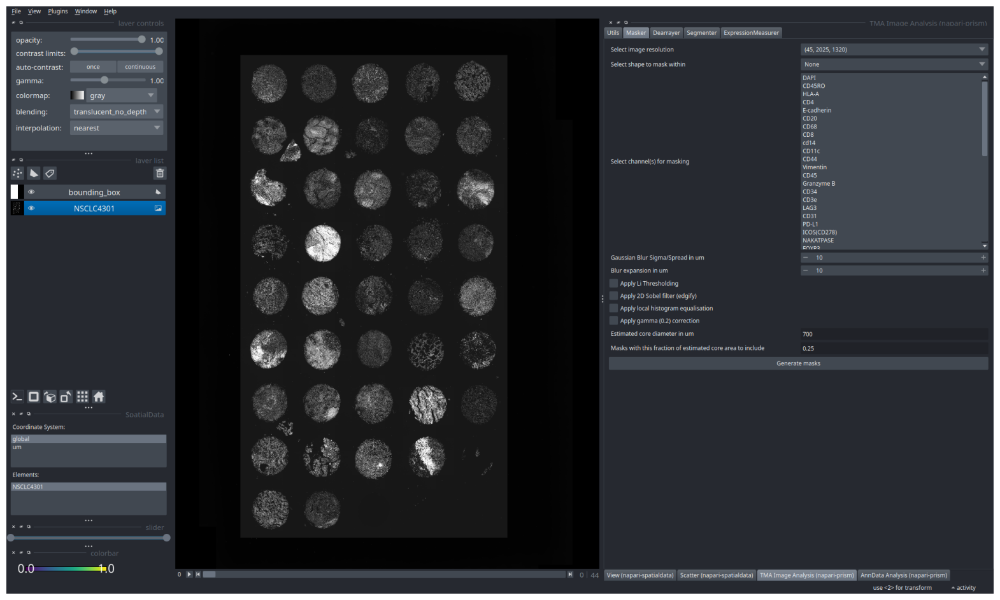

0


In [4]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

1. Choose channel(s) for masking. If multiple channels are chosen it will combine the binary masks together.
2.  Choose masking parameters. Below are some recommendations:
- `Gaussian Blur Sigma in um`: 10
- `Blur expansion in um`: 10
- `Li Thresholding`: Only if the image has high background 
- `2D sobel / edge filter`: Only for very blurry images by highlighting edges 
- `Local histogram equalisation`: Only if the image has noticeable variation in intensity across the image
- `Gamma correction (0.2 value)`: Only if intensities are very low

1.   Provide mask polygon parameters:
- `Estimated core diameter in um`: This will compute and an estimate for the expected area of the TMA cores.
- `Masks with this fraction of estimate core area to include`: Parts of the mask with less than this fraction of the estimated core area will be removed from the polygon representation.

1.   Click `Generate masks`
2.   channel_mask and channel_mask_poly will appear in the `Elements` list at the bottom left
3.   Double click them to visualise in the layer 

In [5]:
# This should have made `DAPI_mask` and `DAPI_mask_poly` in .labels
viewer.layers[0].metadata["sdata"]

SpatialData object, with associated Zarr store: /media/rafael/Data/qptiff_images/NSCLC4301.zarr
├── Images
│     └── 'NSCLC4301': DataTree[cyx] (45, 32400, 21120), (45, 16200, 10560), (45, 8100, 5280), (45, 4050, 2640), (45, 2025, 1320)
├── Labels
│     └── 'DAPI_mask': DataArray[yx] (1709, 945)
└── Shapes
      └── 'DAPI_mask_poly': GeoDataFrame shape: (45, 2) (2D shapes)
with coordinate systems:
    ▸ 'global', with elements:
        NSCLC4301 (Images), DAPI_mask (Labels), DAPI_mask_poly (Shapes)
    ▸ 'um', with elements:
        NSCLC4301 (Images)

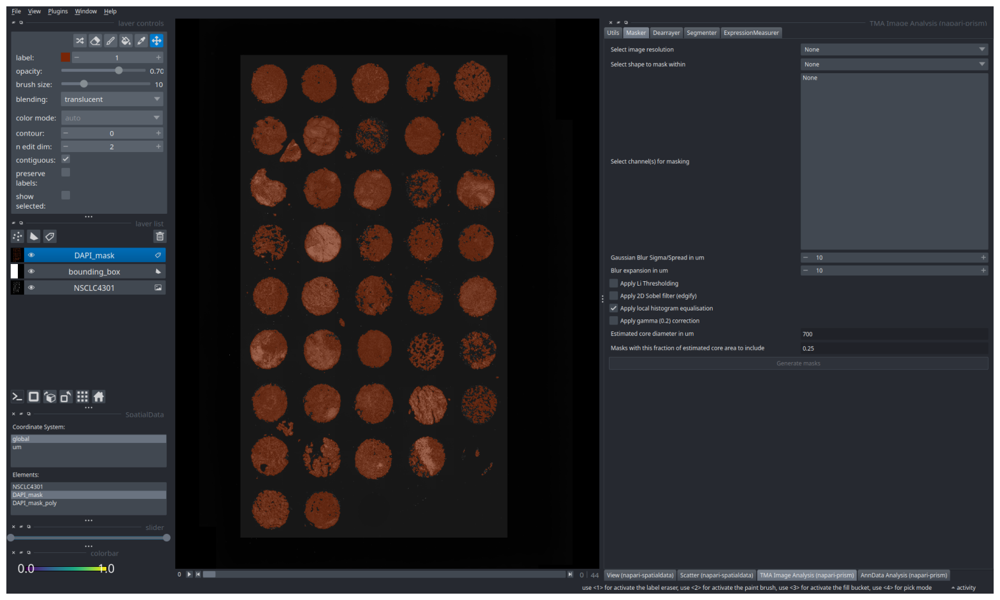

0


In [6]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

The masks appear to be more fragmented in the cores with more sparsely spaced cells (nuclei). 

We can try to amend this by either:
- Playing with image parameters, i.e.) increasing the gaussian blur and/or expansion to 30
- Using multiple channels to capture more of the core

### Increasing blur and expansion

In [ ]:
# Since we mask on DAPI, and it will have the same name, the old mask is overwritten
viewer.layers[0].metadata["sdata"]

SpatialData object, with associated Zarr store: /media/rafael/Data/qptiff_images/NSCLC4301.zarr
├── Images
│     └── 'NSCLC4301': DataTree[cyx] (45, 32400, 21120), (45, 16200, 10560), (45, 8100, 5280), (45, 4050, 2640), (45, 2025, 1320)
├── Labels
│     └── 'DAPI_mask': DataArray[yx] (1709, 945)
└── Shapes
      └── 'DAPI_mask_poly': GeoDataFrame shape: (43, 2) (2D shapes)
with coordinate systems:
    ▸ 'global', with elements:
        NSCLC4301 (Images), DAPI_mask (Labels), DAPI_mask_poly (Shapes)
    ▸ 'um', with elements:
        NSCLC4301 (Images)

0
0


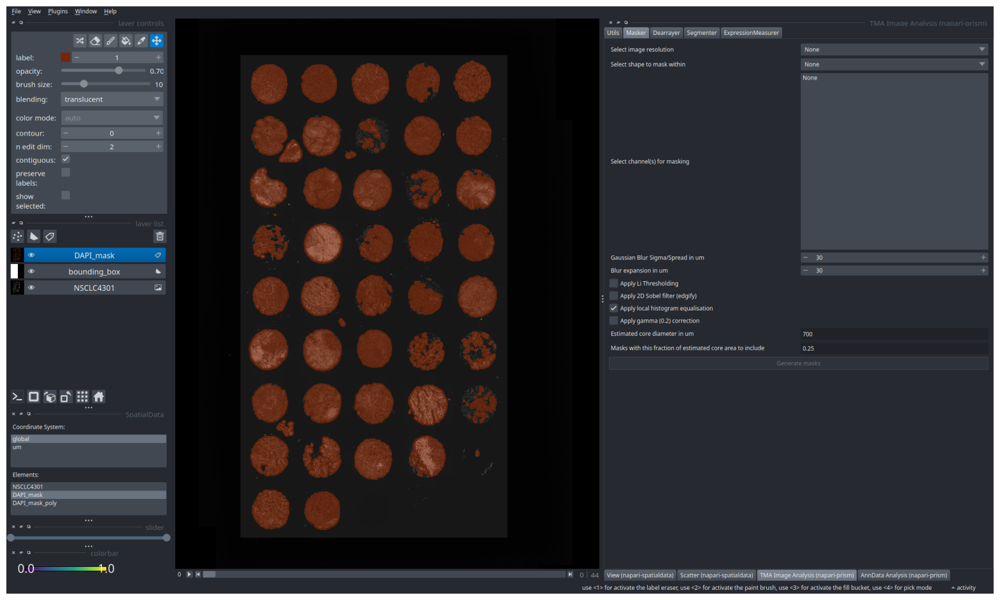

In [9]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

The masks at the bottom right still misses out on some cells. Let's try also using multiple channels:

### Multiple channel masking: DAPI + E-cadherin + Vimentin + Pan-Cytokeratin
- To select multiple channels, hold `Ctrl (⌘ on Mac)` then left click the channels in `Select channels(s) for masking`

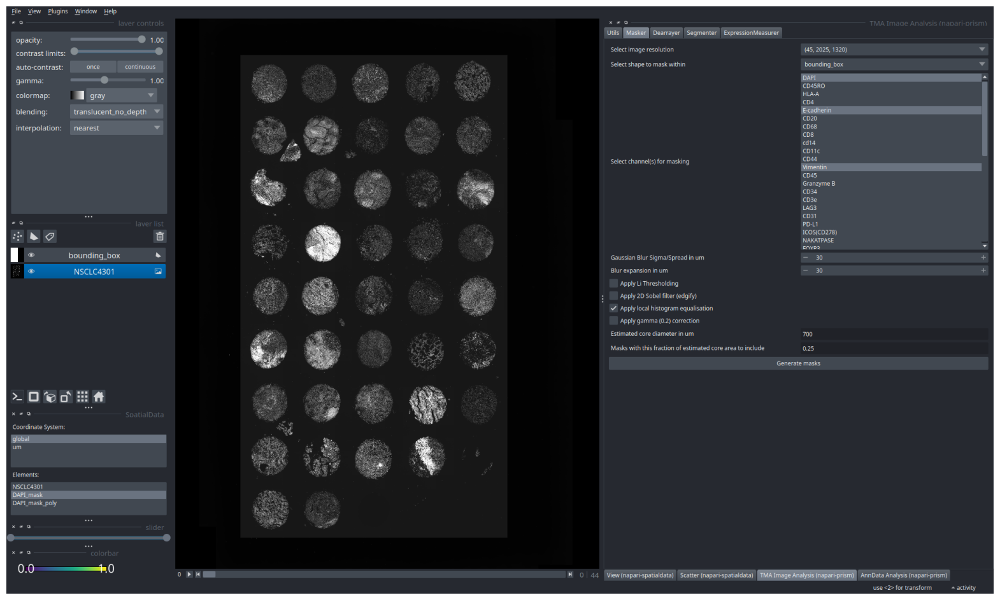

0


In [10]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

In [11]:
# Since we mask on multiple channels, this will have a new longer name of all
# channels chosen and show up as a new element in .labels
viewer.layers[0].metadata["sdata"]

SpatialData object, with associated Zarr store: /media/rafael/Data/qptiff_images/NSCLC4301.zarr
├── Images
│     └── 'NSCLC4301': DataTree[cyx] (45, 32400, 21120), (45, 16200, 10560), (45, 8100, 5280), (45, 4050, 2640), (45, 2025, 1320)
├── Labels
│     ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask': DataArray[yx] (1709, 945)
│     └── 'DAPI_mask': DataArray[yx] (1709, 945)
└── Shapes
      ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask_poly': GeoDataFrame shape: (43, 2) (2D shapes)
      └── 'DAPI_mask_poly': GeoDataFrame shape: (43, 2) (2D shapes)
with coordinate systems:
    ▸ 'global', with elements:
        NSCLC4301 (Images), DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask (Labels), DAPI_mask (Labels), DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask_poly (Shapes), DAPI_mask_poly (Shapes)
    ▸ 'um', with elements:
        NSCLC4301 (Images)

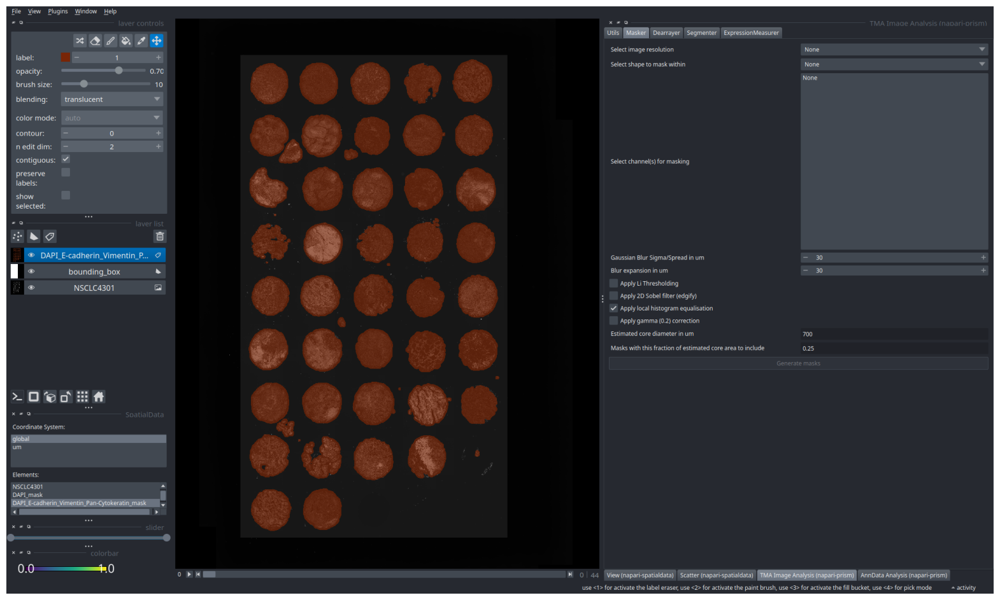

In [12]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

## Dearraying
Dearraying is the process of segmenting and assigning labels to cores according to the grid of the tissue microarray. This is important as this is is how the metadata (i.e. clinical metadata, patient information, disease state, etc) is related back to each core.

We *currently* provide a minimal and oversimplified dearraying algorithm:
- Blob detection with the Difference of Gaussians (DoG) on the binary masks / raw image from the previous step
- Estimation of the TMA grid using the detected blobs
- Fitting of TMA grid labels to each blob

The outputs of this are:
1) The traditional TMA core circles: `tma_core`
2) Rectangles enveloping the circle shapes AND the mask: `tma_envelope`

### Steps
1. Select the `Dearrayer` tab at the top of the widget
2. Select the binary mask layer in the layer list (`DAPI_mask` or `DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask`). This will show up as the `Selected layer`.
3. Input an estimated or known value for core diameters in um, similar to the previous tab 
4. (Optional, but recommended) Input the expected number of rows and column in the TMA grid. 
   - If values are given, one-dimensional KMeans clustering is used to estimate the x and/or y coordinates of each grid element.
   - Otherwise, a rolling-mean with a predefined threshold is used to estimate x and y coordinates of each grid element.
5. Click `Dearray`
6. tma_core and tma_envelope will appear in the `Elements` at the bottom left
7. Double click `tma_envelope` to visualise in the layer 

In [ ]:
# These will be added as .shapes, as GeoDataFrames.
viewer.layers[0].metadata["sdata"]

SpatialData object, with associated Zarr store: /media/rafael/Data/qptiff_images/NSCLC4301.zarr
├── Images
│     └── 'NSCLC4301': DataTree[cyx] (45, 32400, 21120), (45, 16200, 10560), (45, 8100, 5280), (45, 4050, 2640), (45, 2025, 1320)
├── Labels
│     ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask': DataArray[yx] (1709, 945)
│     └── 'DAPI_mask': DataArray[yx] (1709, 945)
├── Shapes
│     ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask_poly': GeoDataFrame shape: (43, 2) (2D shapes)
│     ├── 'DAPI_mask_poly': GeoDataFrame shape: (43, 2) (2D shapes)
│     ├── 'tma_core': GeoDataFrame shape: (41, 6) (2D shapes)
│     └── 'tma_envelope': GeoDataFrame shape: (41, 2) (2D shapes)
└── Tables
      └── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask_tma_table': AnnData (41, 0)
with coordinate systems:
    ▸ 'global', with elements:
        NSCLC4301 (Images), DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask (Labels), DAPI_mask (Labels), DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask_poly 

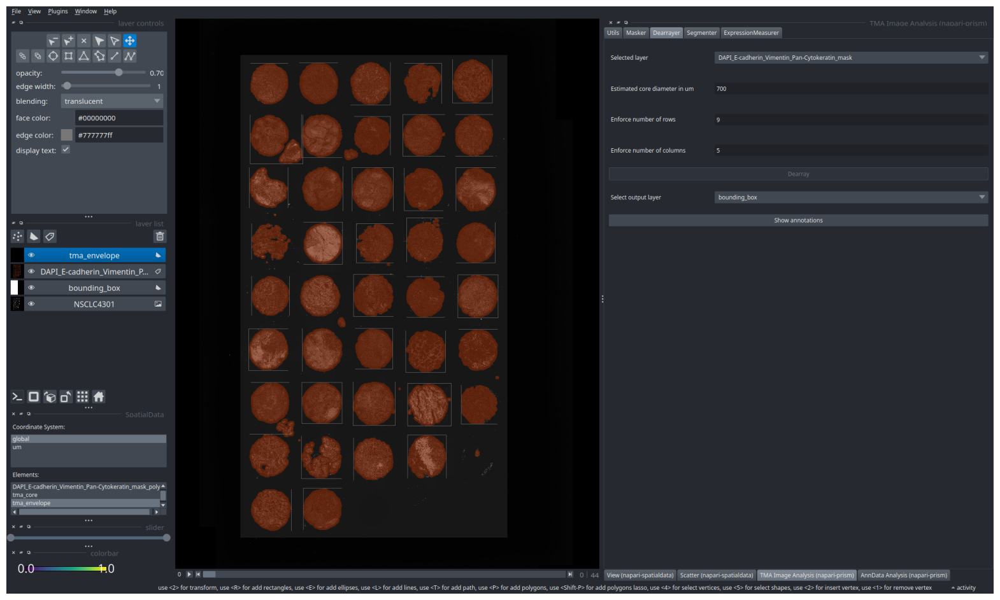

In [14]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

8. For `Select output layer`, select the `tma_envelope` layer to show the annotations
9. Click `Show Annotations`

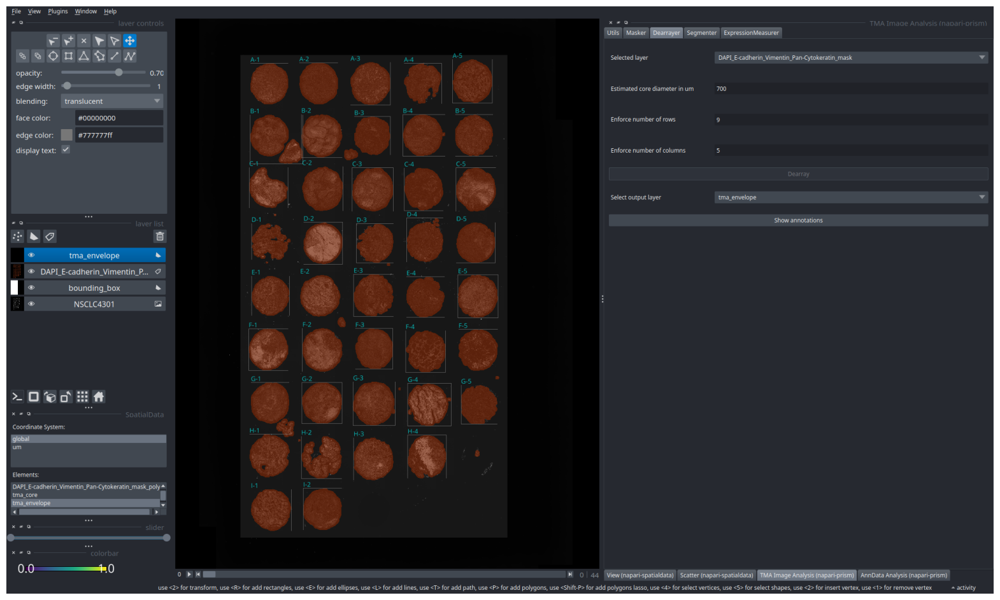

In [15]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()


Note that some of the edges of the boxes may not be rendered at full zoom. Zoom in to see:

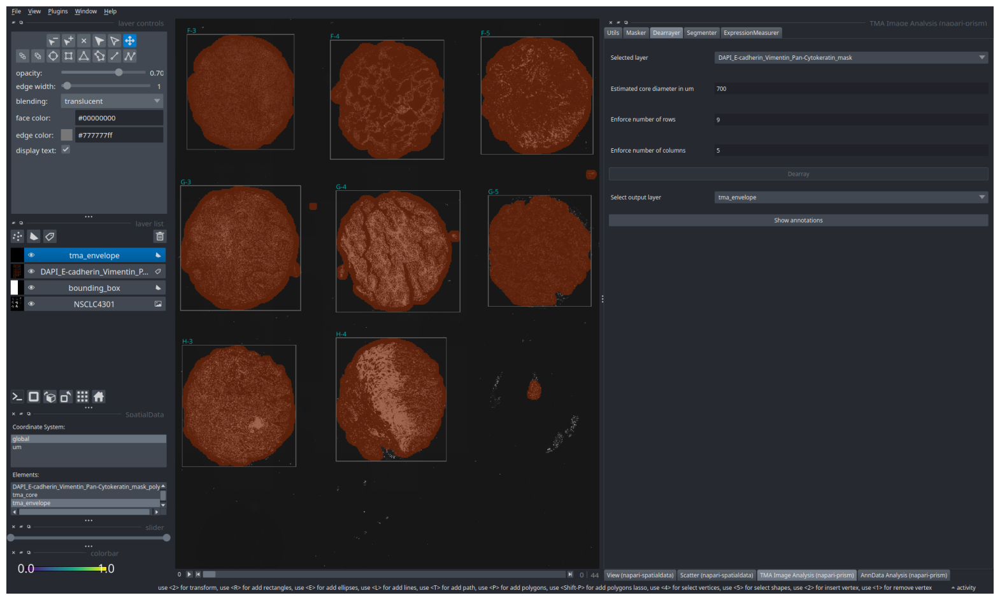

In [16]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

Adjust the boxes as necessary. As an example let's adjust C-5 to capture a larger padding around the core:

9. Select the `tma_envelope` layer in the layer list
10. Click the select shapes icon <img src="../_static/notebook_images/select_shapes_icon.png" width="20">
11. Click the box to adjust in the viewer

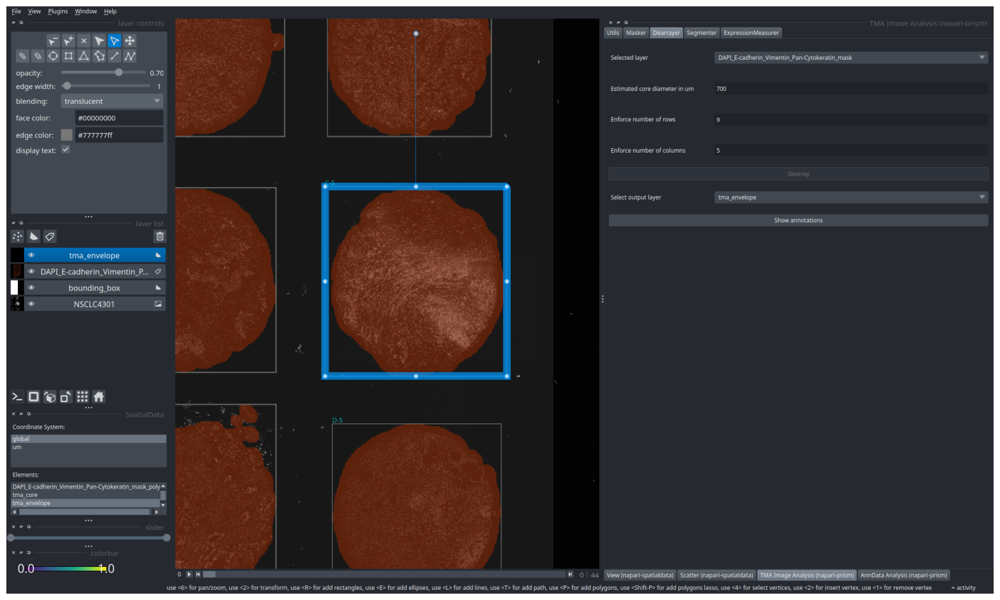

In [17]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

12. Adjust the box:
- Move the box by dragging the centre of the box
- Reshape the box by dragging a corner or edge (white circle)
Here we adjust we increase the box for C-5:

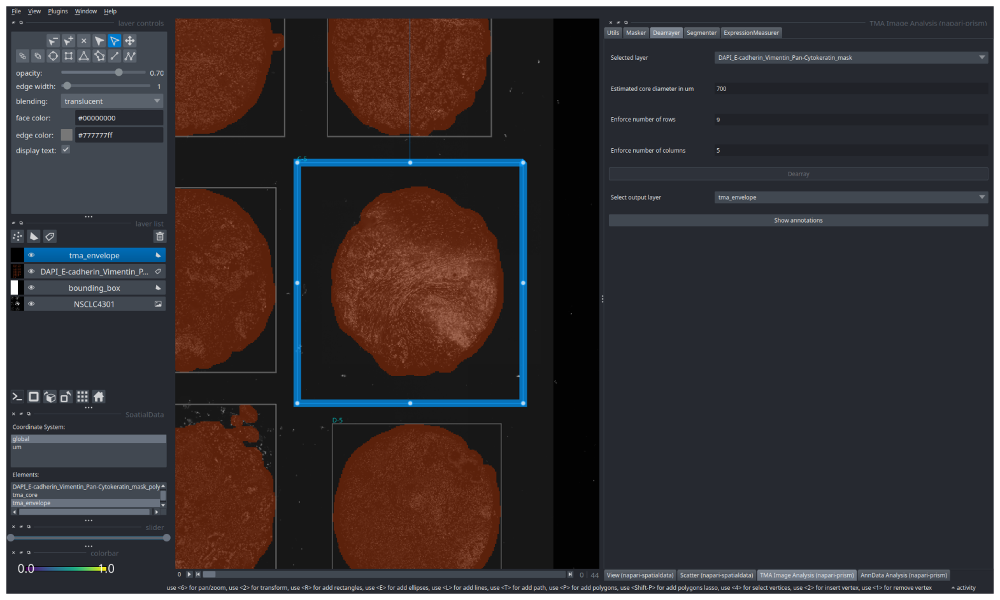

In [18]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

13. Navigate to the `Utils` tab at the top of the widget
14. Click `Overwrite save selected layer`, with `tma_envelope` selected (this will save the adjustments to disk)

For the sake of demonstrating the removal of 'poor' quality cores, we will drop the C-5 core.

15. Select the `tma_envelope` layer
16. Click the select shapes icon <img src="../_static/notebook_images/select_shapes_icon.png" width="20">
17. Press `Delete`
18. Save by doing steps 13-14

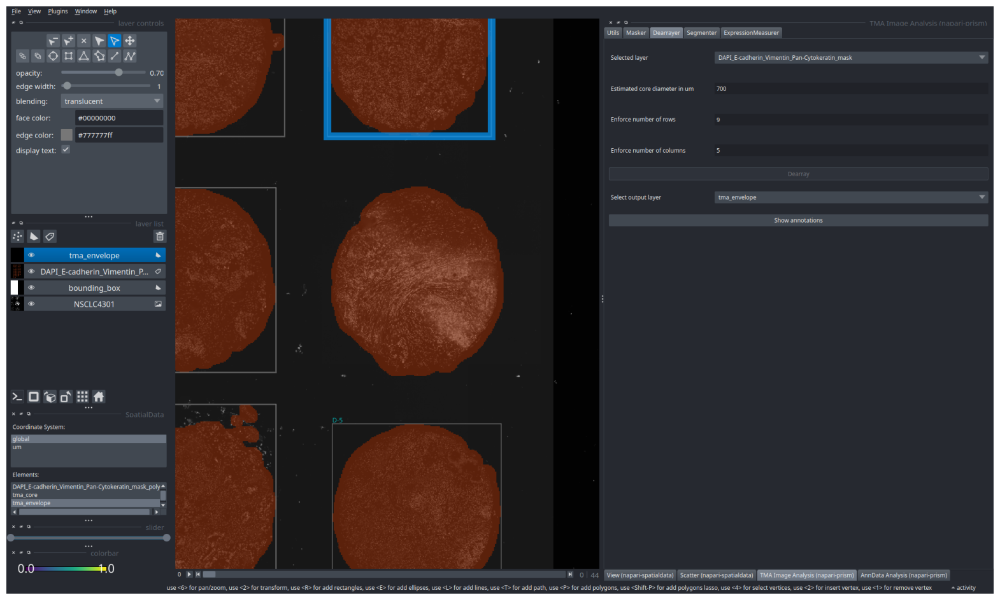

In [19]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

In [ ]:
# We can confirm that C-5 has been deleted in the viewer...
print("C-5" not in viewer.layers[-1].metadata["_columns_df"])
# ... and in the SpatialData object:
print("C-5" not in viewer.layers[-1].metadata["sdata"]["tma_envelope"])

True
True


## Segmenter

Next, we perform cell segmentation on the image. We make this process more efficient by only performing segmentation within the detected TMA cores, skipping over background, and dropped TMA cores.

- We currently only support [cellpose](https://github.com/MouseLand/cellpose) for cell segmentation, and provide a similar interface for tweaking segmentation parameters as the [cellpose-napari plugin](https://github.com/MouseLand/cellpose-napari). 

- We provide functions for creating 'meta-channels' which are merged intensity projections of multiple channels selected by the user. This is useful for performing cytoplasm-based cell segmentation (i.e. cyto3) on images with no single reliable cytoplasmic channel. 

The outputs of this tab are:
1) An instance labelled mask (cell segmentation masks): `{image}_labels`
2) A table which annotates the labelled mask, containing cell indices, the TMA core label a cell belongs to, and the parent image (NSCLC4301): `{image}_labels`

At this stage, we have removed the `DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask` and `bounding_box` layers to tidy the viewer.

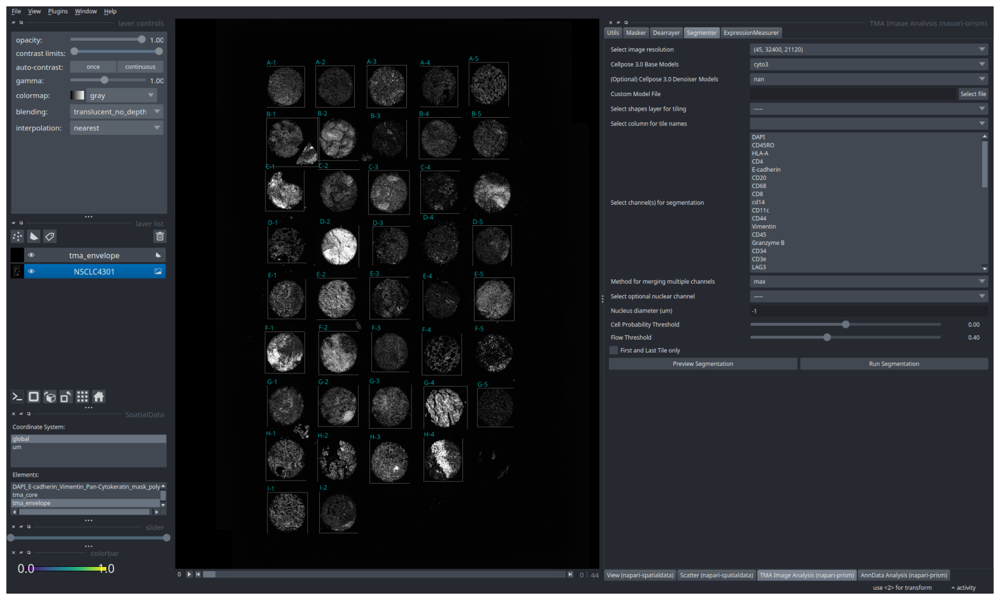

In [22]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()


### Steps
1. Select the `Segmenter` tab at the top of the widget
2. Reselect the image layer `NSCLC4301`
3. Select an image resolution (Channels, Y pixels, X pixels) to perform cell segmentation. Currently, we support doing this only on the highest resolution.
4. Select a base cellpose model (here we use `cyto3`)
5. (Optional) Select a cellpose denoiser model (this overrides the base model selection above). [These models perform image restoration/denoising prior to segmentation](https://www.biorxiv.org/content/10.1101/2024.02.10.579780v2).
6. (Optional) Select a custom cellpose model file (this overrides both model selections above). 
7. Select a shapes layer for tiling: This performs segmentations in discrete regions specified by an annotated shapes layer. This will be the `tma_envelopes` layer from the previous step. 
8. Select column for tile names: This will be the column in the annotated shapes layer that detail the label of each region. This will be `tma_label`, containing the string name of each TMA core from the previous step.

<p align="center">
  <img src="../_static/notebook_images/segmenter_params_1.png" />
</p>

9.  Select channel(s) for segmentation. User can select multiple channels for segmentation by holding Ctrl (⌘ on Mac) then left clicking all desired channels.
10. Select a method for merging multiple channels: If multiple channels were selected, these are then merged into a 'meta-channel' by performing an intensity projection across the channel axis. i.e.) "max" performs a maximum intensity projection

Here, we select and merge `E-cadherin`, `Vimentin`, and `Pan-Cytokeratin` (not shown) with a maximum intensity projection:
<p align="center">
  <img src="../_static/notebook_images/segment_multiple_channel.png" />
</p>

11. If supported, then an additional nuclear channel can be specified (i.e. the cyto3 model can take an additional nuclear channel such as DAPI to enhance results).
<p align="center">
  <img src="../_static/notebook_images/segment_nucleus_dapi.png" />
</p>


12. Input a nucleus diameter. If this value is -1, then it is automatically estimated by cellpose. 
13. Cell probability threshold: [Decrease if undersegmenting in dim areas, vice-versa](https://cellpose.readthedocs.io/en/latest/settings.html#cellprob-threshold)
14. Flow threshold: [Decrease if segmentation shapes are unexpected, increase if undersegmenting](https://cellpose.readthedocs.io/en/latest/settings.html#flow-threshold)
15. (Optional, but highly recommended) Tick `First and Last Tile only` to segment the first and last region from the provided tiling shapes layer. This is useful for testing and optimising for segmentation parameters before performing it on the entire image.
16. (Optional, but highly recommended) Click `Preview Segmentation`. This will show the user a preview of the merged channels in green with the optional nuclear channel in blue ( if specified):

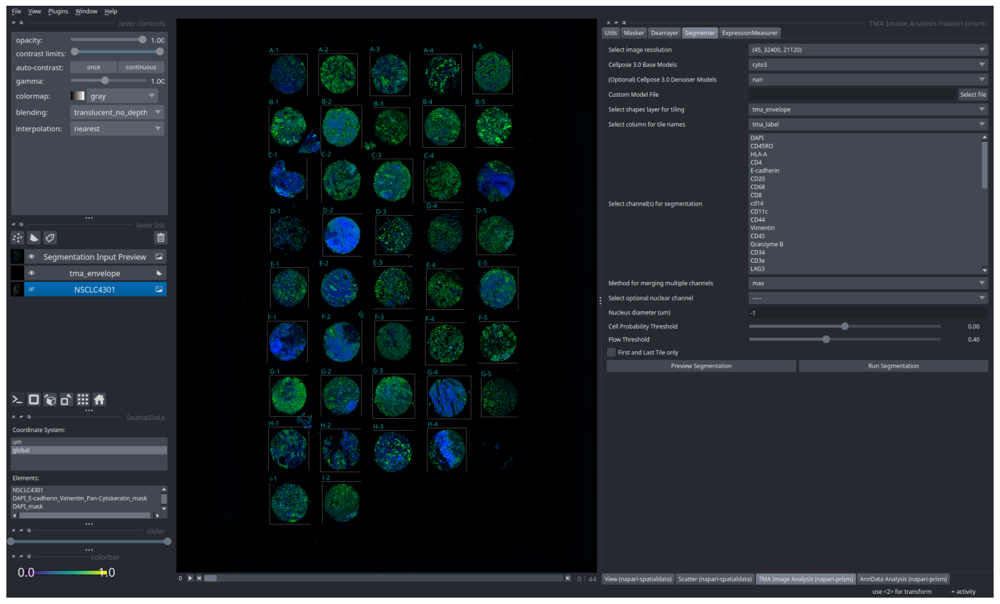

INFO     Transposing `data` of type: <class 'dask.array.core.Array'> to ('y',   
         'x').                                                                  


In [2]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()


17. Click `Run Segmentation`. This button will be greyed out while it is running. When it becomes clickable, it means that segmentation is complete.
18. After segmentation, the segmentation masks `NSCLC_labels` will appear in the `Elements` list
19. Double click to add and visualise in the viewer.

In [2]:
# These will be added in .labels, as {image}_labels.
# The accompanying AnnData table containing the cell indices and basic .obs
# will be added in .tables, as {_image}_labels_expression.
viewer.layers[0].metadata["sdata"]

SpatialData object, with associated Zarr store: /media/rafael/Data/qptiff_images/NSCLC4301.zarr
├── Images
│     └── 'NSCLC4301': DataTree[cyx] (45, 32400, 21120), (45, 16200, 10560), (45, 8100, 5280), (45, 4050, 2640), (45, 2025, 1320)
├── Labels
│     ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask': DataArray[yx] (1709, 945)
│     ├── 'DAPI_mask': DataArray[yx] (1709, 945)
│     └── 'NSCLC4301_labels': DataArray[yx] (32400, 21120)
├── Shapes
│     ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask_poly': GeoDataFrame shape: (43, 2) (2D shapes)
│     ├── 'DAPI_mask_poly': GeoDataFrame shape: (43, 2) (2D shapes)
│     ├── 'tma_core': GeoDataFrame shape: (41, 6) (2D shapes)
│     └── 'tma_envelope': GeoDataFrame shape: (40, 2) (2D shapes)
└── Tables
      ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask_tma_table': AnnData (41, 0)
      └── 'NSCLC4301_labels_expression': AnnData (210827, 0)
with coordinate systems:
    ▸ 'global', with elements:
        NSCLC4301 (Images), DAPI_E-

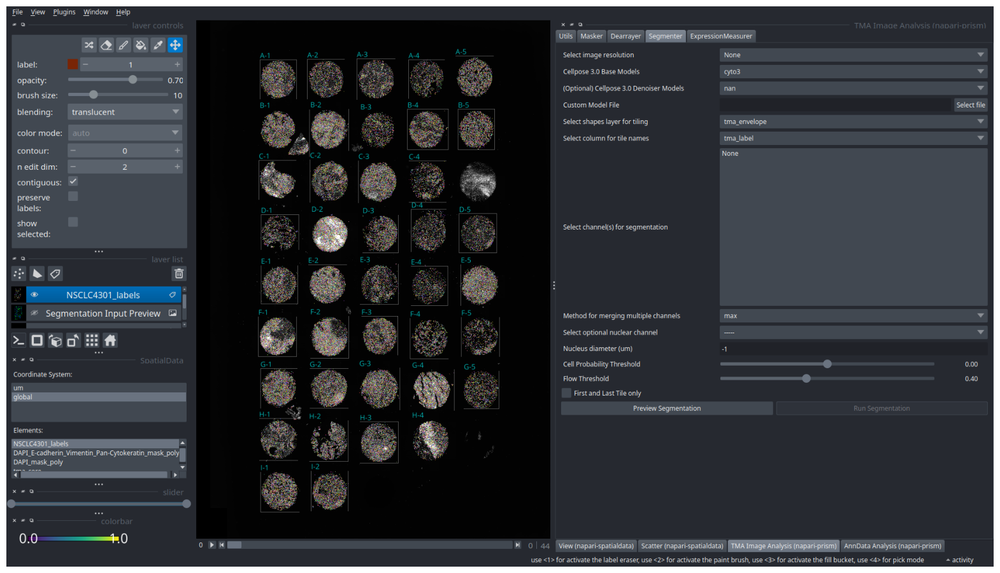

In [5]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

Zooming into A-5:

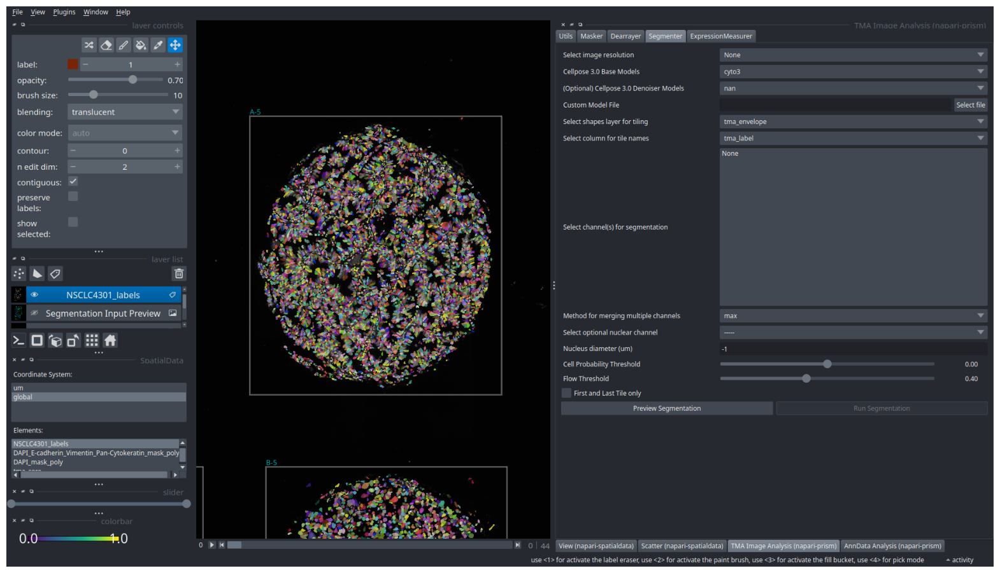

In [6]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

This 'cell-level' segmentation layer will also have a linked {class}`anndata.AnnData` table called `NSCLC4301_labels_expression` also saved in the SpatialData object. The attributes can be seen and visualised on each cell in the `View (napari-spatialdata)` widget tab.
- index: Cell id or index
- region_label: Label from dearrayer. In this image for example are cells with region_label "I-2"
- lyr: Image layer or name of the parent raw image that segmentation was performed on. In this example, "NSCLC4301"

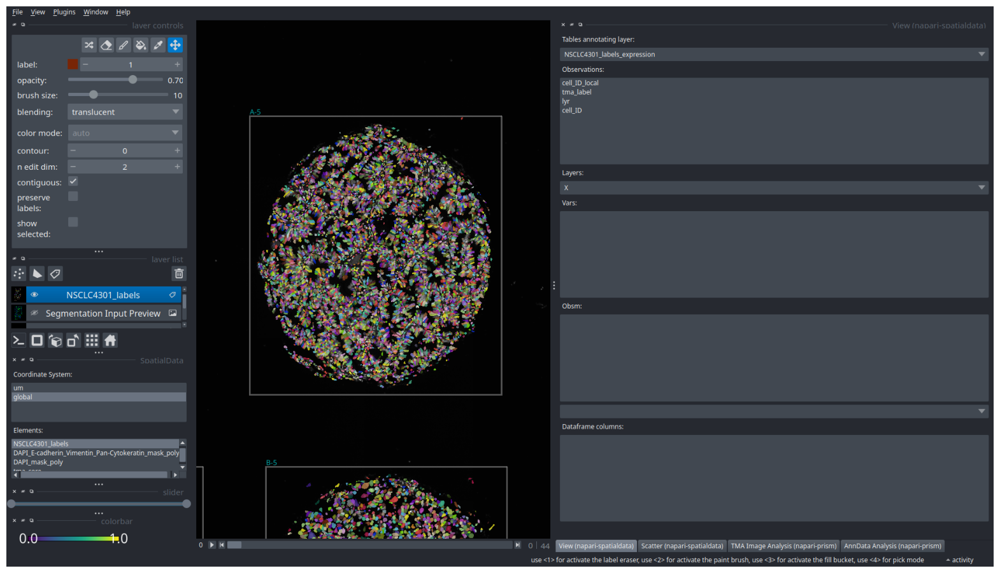

In [7]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

Cells can be colored by their `cell_ID_local` by double clicking this attribute in the Observations widget.
Later, this can be colored by any measured properties within each cell instance.

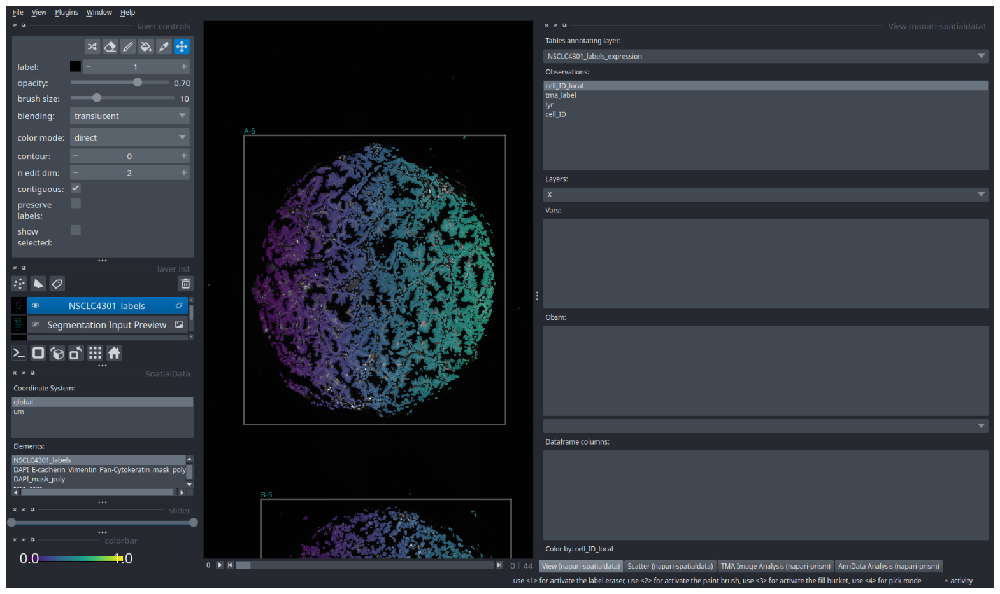

In [2]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

## ExpressionMeasurer

In this tab, image measurements can be made for each instance or cell from the cell segmentation masks.

For each cell/instance, the mean or median intensity of each channel is measured as a proxy for expression levels, alongside other morphological and image properties.


### Steps
1. Select the `ExpressionMeasurer` tab at the top of the widget
2. Reselect the image layer in the layer list (NSCLC4301) 
3. Select the segmentation layer containing the cells or instances (NSCLC4301_labels)
4. Select the shapes layer for tiling: the `tma_envelope` layer.
5. (Optional) Measure extended properties. Hover over this to view the additional image properties to measure on each cell/segmentation instance. 
<p align="center">
  <img src="../_static/notebook_images/additional_image_properties.png" />
</p>

6. Select the intensity modality for quantifying 'expression' of a cell/instance.
7. Click `Measure` (hover over the button to see the entire list of properties measured, by default intensity_mean is shown, but if median is selected will do intensity_median)
<p align="center">
  <img src="../_static/notebook_images/measure_properties.png" />
</p>

1. Navigate to the `View (napari-spatialdata)` tab.
2. Reselect the labels layer `NSCLC4301_labels`. Note the new table containing the measured data:

In [ ]:
# The NSCLC4301_labels_expression table will now have '45' features which are the
# intensities or marker expression for each cell
viewer.layers[0].metadata["sdata"]

SpatialData object, with associated Zarr store: /media/rafael/Data/qptiff_images/NSCLC4301.zarr
├── Images
│     └── 'NSCLC4301': DataTree[cyx] (45, 32400, 21120), (45, 16200, 10560), (45, 8100, 5280), (45, 4050, 2640), (45, 2025, 1320)
├── Labels
│     ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask': DataArray[yx] (1709, 945)
│     ├── 'DAPI_mask': DataArray[yx] (1709, 945)
│     └── 'NSCLC4301_labels': DataArray[yx] (32400, 21120)
├── Shapes
│     ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask_poly': GeoDataFrame shape: (43, 2) (2D shapes)
│     ├── 'DAPI_mask_poly': GeoDataFrame shape: (43, 2) (2D shapes)
│     ├── 'tma_core': GeoDataFrame shape: (41, 6) (2D shapes)
│     └── 'tma_envelope': GeoDataFrame shape: (40, 2) (2D shapes)
└── Tables
      ├── 'DAPI_E-cadherin_Vimentin_Pan-Cytokeratin_mask_tma_table': AnnData (41, 0)
      └── 'NSCLC4301_labels_expression': AnnData (210827, 45)
with coordinate systems:
    ▸ 'global', with elements:
        NSCLC4301 (Images), DAPI_E

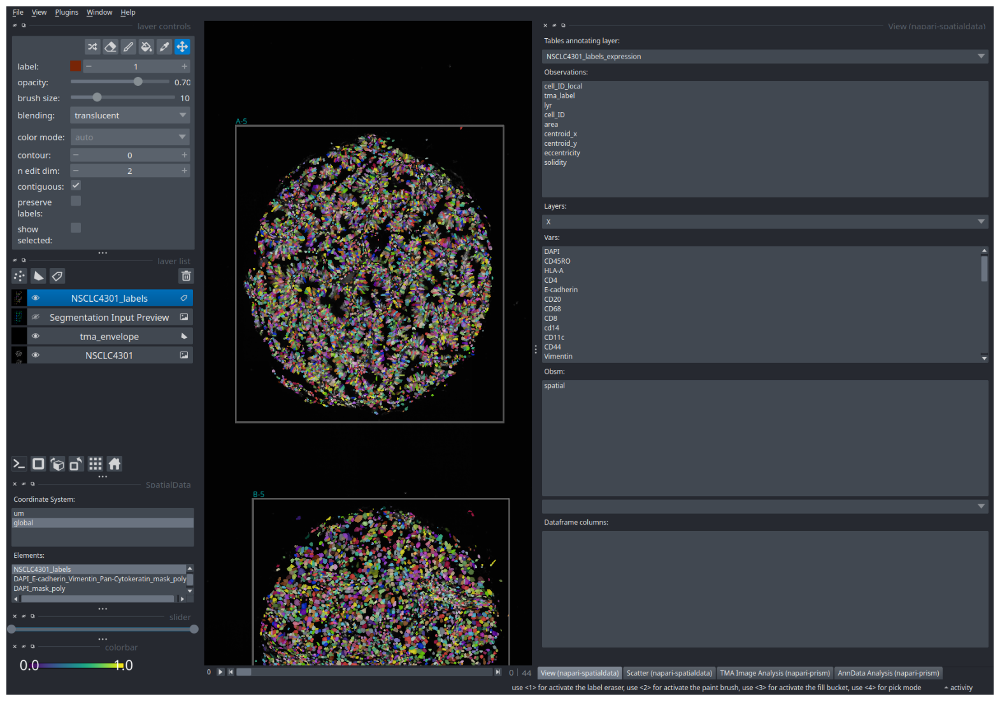

In [3]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

We can visualise by these new attributes (.obs and .var) by double clicking them in this widget,

i.e. by `Obs`: color by the `area` of the cell:

In [ ]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()


i.e. by `Vars`: color by the raw intensity of `GLUT1`:

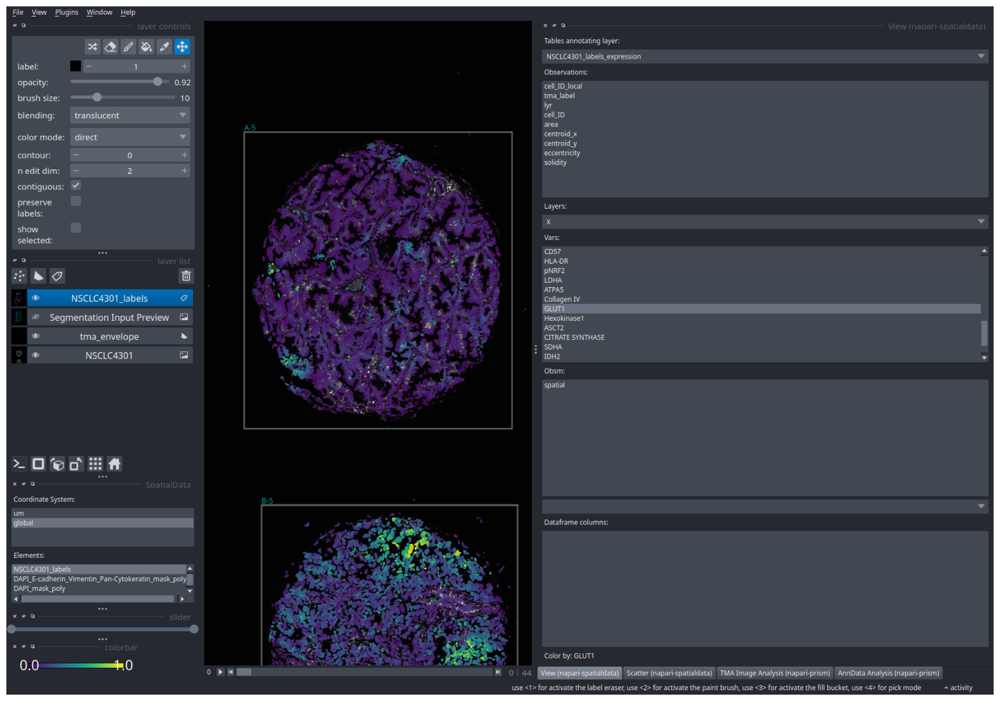

In [5]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

## Next Steps
Currently, there is no need to explicitly save any of the outputs generated in this widget, as (for now) the strategy is to save them directly to the on-disk SpatialData .zarr store with each button press.

The user may continue directly onto the [AnnData analysis section](adata_usage.ipynb). 